In [1]:
#hide
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 527.3/527.3 kB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.9/39.9 MB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 10.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pyarrow<15.0.0a0,>=14.0.1, but you have pyarrow 17.0.0 which is incompatible.
ibis-framework 8.0.0 requires pyarrow<16,>=2, but you have pyarrow 17.0.0 which is incompatible.
Mounted at /content/gdrive


In [2]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [3]:
key = os.environ.get('AZURE_SEARCH_KEY', '3986ff4258a646bbb526b27910d4fab6')

In [5]:
results = search_images_bing(key, 'grizzly bear')
ims = results.attrgot('contentUrl')
ims

(#150) ['http://2.bp.blogspot.com/-NjMTuklENdE/UHzVv_8dIxI/AAAAAAAAA-U/tNBsQDn8kFI/s1600/Grizzly+Bear+Pic.jpg','http://3.bp.blogspot.com/-S1scRCkI3vY/UHzV2kucsPI/AAAAAAAAA-k/YQ5UzHEm9Ss/s1600/Grizzly+Bear+Wildlife.jpg','https://d3d0lqu00lnqvz.cloudfront.net/media/media/897b2e5d-6d4c-40fa-bbe8-6829455747e2.jpg','https://www.goodfreephotos.com/albums/animals/mammals/grizzly-bear-in-the-wild.jpg','https://cdn.britannica.com/19/186719-050-887A6F2C/Grizzly-bear-Rocky-Mountains-Wyoming.jpg','http://www.animalfactsencyclopedia.com/images/grizzlybearstanding.jpg','http://wallsdesk.com/wp-content/uploads/2017/01/Grizzly-Bear-full-HD.jpg','https://animalcorner.org/wp-content/uploads/2015/02/grizzly-bear-1.jpg','https://upload.wikimedia.org/wikipedia/commons/thumb/a/a9/GrizzlyBearJeanBeaufort.jpg/1200px-GrizzlyBearJeanBeaufort.jpg','https://www.rwongphoto.com/images/xl/RW6844-2_web.jpg'...]

In [6]:
dest = 'images/grizzly.jpg'
download_url(ims[0], dest)

Path('images/grizzly.jpg')

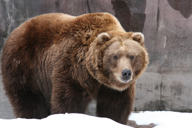

In [8]:
img = Image.open(dest)
img.to_thumb(192)

In [9]:
bears = 'grizzly', 'black', 'teddy'
path = Path('bears')

In [12]:
if not path.exists():
  path.mkdir()
  for bear in bears:
    dest = path/bear
    dest.mkdir(exist_ok=True)
    results = search_images_bing(key, f'{bear} bear')
    download_images(dest, urls=results.attrgot('contentUrl'))

In [23]:
fns = get_image_files(path)
fns

(#414) [Path('bears/black/745f6e0e-7cea-4a8f-b5cb-2fd1a310367b.jpg'),Path('bears/black/54b5c082-d0c5-445d-9ca5-1fbdb136453f.jpg'),Path('bears/black/bfb024df-b4c5-4b5a-8cf7-e734e1bebff5.jpg'),Path('bears/black/a727df54-be8f-4798-acd6-8c2f9bcb3a97.jpg'),Path('bears/black/e0e2b80d-a2d1-4867-8f3f-61dae9f89993.jpg'),Path('bears/black/39377bd9-52af-4006-b669-544a6b77bdf2.jpg'),Path('bears/black/0d34c941-7f37-4f07-94c1-cc536882c824.jpg'),Path('bears/black/519794a4-12e8-4c26-8b05-60d579db0375.jpg'),Path('bears/black/b1f48d2e-5fac-4f6d-98b9-67ceb39f0082.jpg'),Path('bears/black/ab2ce6f2-defa-4238-beb6-d5b2209c0eff.jpg')...]

In [25]:
failed = verify_images(fns)
failed

(#28) [Path('bears/black/e0e2b80d-a2d1-4867-8f3f-61dae9f89993.jpg'),Path('bears/black/246a1c87-ab0f-46c6-a56d-48e01c1475fc.jpg'),Path('bears/black/d7fc0950-c98d-4ea1-806c-745949bbb412.jpg'),Path('bears/black/c38bccde-2963-4462-aa98-089fb98343cf.jpg'),Path('bears/black/59d6bfc9-762a-48cd-a2e4-9bd9f2c7bad3.jpg'),Path('bears/black/48da5039-7871-4a9a-9f87-788467c57721.jpg'),Path('bears/black/cf907ddd-8cb4-4b55-860d-e0da1479d82c.JPG'),Path('bears/black/3278ca2e-9b36-4189-83e4-22acdd0335e8.jpg'),Path('bears/black/4c30dc14-7ff2-4294-ba1a-11ee14f277ee.jpg'),Path('bears/black/8bf3353b-b485-4d5c-9b2c-f6e33962033a.jpg')...]

In [26]:
failed.map(Path.unlink)

(#28) [None,None,None,None,None,None,None,None,None,None...]

In [29]:
bears = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128)
)

In [30]:
dls = bears.dataloaders(path)

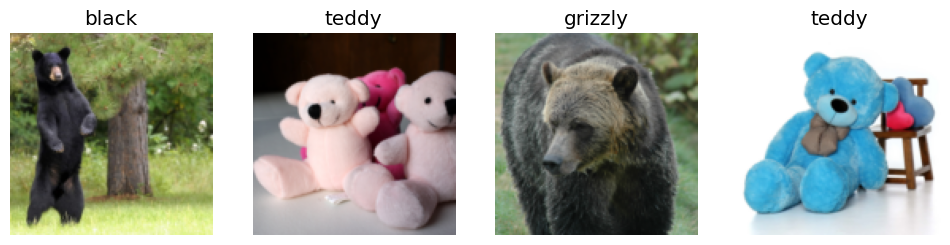

In [33]:
dls.train.show_batch(max_n=4, nrows=1)

In [34]:
dls = bears.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms()
)
dls = bears.dataloaders(path)

In [35]:
learn = vision_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 159MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.399067,0.246976,0.090909,02:33


epoch,train_loss,valid_loss,error_rate,time
0,0.289775,0.131610,0.064935,03:11
1,0.217139,0.065216,0.012987,03:09
2,0.169830,0.030001,0.012987,03:14
3,0.145425,0.031056,0.012987,03:12


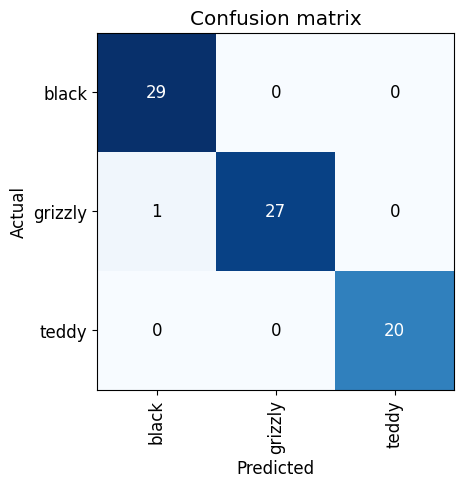

In [36]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

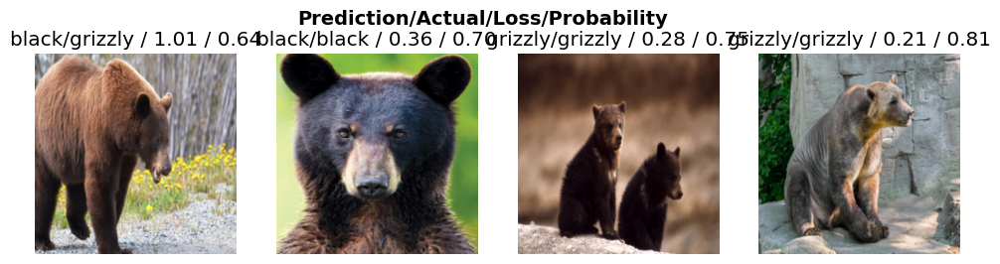

In [38]:
interp.plot_top_losses(4, nrows=1)

In [39]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [40]:
learn.export()

In [41]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [42]:
learn_inf = load_learner(path/'export.pkl')

In [43]:
learn_inf.predict('images/grizzly.jpg')

('grizzly', tensor(1), tensor([1.1546e-03, 9.9880e-01, 4.7703e-05]))

In [44]:
learn_inf.dls.vocab

['black', 'grizzly', 'teddy']

In [45]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

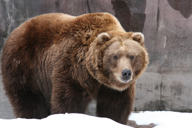

In [49]:
btn_upload = SimpleNamespace(data = ['images/grizzly.jpg'])
img = PILImage.create(btn_upload.data[-1])
img.to_thumb(192)

In [50]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [59]:
pred, pred_idx, probs = learn_inf.predict(img)

In [57]:
probs[1], pred

(tensor(0.9988), 'grizzly')

In [60]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: grizzly; Probability: 0.9988')

In [67]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

Prediction: grizzly; Probability: 0.9988


In [72]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred = widgets.Label()
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
    print(lbl_pred.value)

btn_run.on_click(on_click_classify)

In [71]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

Prediction: grizzly; Probability: 0.9988
